%%capture
!pip install scanpy
!pip install KDEpy
!pip install leidenalg

In [1]:
import os
import sys

import pandas as pd
import scanpy as sc
import anndata as ad
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.sparse as sps
from scipy.stats import spearmanr

# to be able to import from tools dir
module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path)

# os.environ['R_HOME'] = "/Library/Frameworks/R.framework/Resources"
# import pertpy as pt
    
import tools.util_probe as up
import tools.util as ut
import tools.NB_est as nb
import tools.countsplit as cs
import tools.scDEED as scd
import tools.clustering_opt as co
import tools.util_plot as nmd_plot
from tools import NMD as nmd

import warnings
warnings.filterwarnings("ignore")

from scipy.stats import kendalltau
import importlib

In [2]:
def plot_reconstruction(
    X_reconstruction, X, title,hue=None, type="scatter", sample_fraction=None
):
    """Plot original sparse non-negative matrix against the reconstructed one

    Also computes the Pearson correlation between both

    Args:
        X_reconstruction (_type_): Reconstructed matrix, e.g. np.maximum(0, Theta)
        X (_type_): The original sparse non-negative matrix
        title (_type_): _description_
        type (str, optional): _description_. Defaults to "scatter".
        sample_fraction (_type_, optional): _description_. Defaults to None.
    """
    X_recon_max = np.max(X_reconstruction)
    X_max = np.max(X)
    max_axis = max(X_recon_max, X_max)
    correlation = np.corrcoef(X_reconstruction.flatten(), X.flatten())[0][1]

    df = pd.DataFrame(
        {"original": X.flatten(), "reconstruction": X_reconstruction.flatten()}
    )

    if sample_fraction:
        df = df.sample(frac=sample_fraction, axis=0)

    fig, ax = plt.subplots()
    match type:
        case "scatter":
            if hue is not None:
                p = sns.scatterplot(data=df, x="reconstruction", y="original", hue=hue, alpha=0.1)
            else:
                p = sns.scatterplot(data=df, x="reconstruction", y="original", alpha=0.1)
        # case "kde":
        # p = sns.kdeplot(X_reconstruction.flatten(), X.flatten())
        # p = sns.kdeplot(data=df, x="reconstruction", y="original")
    p.set_ylim(0, max_axis)
    p.set_xlim(0, max_axis)
    plt.suptitle(title)
    plt.title(f"Pearson correlation: {round(correlation, 3)}")
    plt.xlabel("Reconstruction")
    plt.ylabel("Original data")
    ax.axline(xy1=(0, 0), slope=1, linewidth=1, color="r")
    plt.show()


In [3]:
data_all_pca = sc.read_h5ad("../../data/MOBA_scRNAseq/MOBA_intermediate_results/export_s2.h5ad")
data_all_pca

AnnData object with n_obs × n_vars = 1255 × 5540
    obs: 'total_counts', 'n_genes_by_counts', 'leiden_opt'
    var: 'total_counts', 'n_cells_by_counts', 'TU_ID', 'nb_overdisp_cutoff', 'pval_cluster_0', 'pval_cluster_1', 'pval_cluster_2', 'pval_cluster_3'
    uns: 'leiden', 'leiden_opt_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [4]:
data_all_pca.varm["PCs"].shape

(5540, 50)

In [5]:
data_counts = sc.read_h5ad("../../data/MOBA_scRNAseq/MOBA_intermediate_results/S2_filtered_with_counts.h5ad")
data_counts

AnnData object with n_obs × n_vars = 1255 × 5540
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm', 'total_counts_scale'
    var: 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'var_counts', 'nb_mean', 'nb_overdisp', 'nb_overdisp_cutoff', 'nb_overdisp_cutoff_bfgs', 'nb_overdisp_bfgs'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts', 'normalized_counts', 'vst_counts'

In [6]:
importlib.reload(nmd_plot)

<module 'tools.util_plot' from '/dss/dsshome1/07/di35buw/NMD/BacSC/tools/util_plot.py'>

In [7]:
data_all_pca.uns["leiden_opt_colors"]

array(['#1f77b4', '#d62728', '#e377c2', '#17becf'], dtype=object)

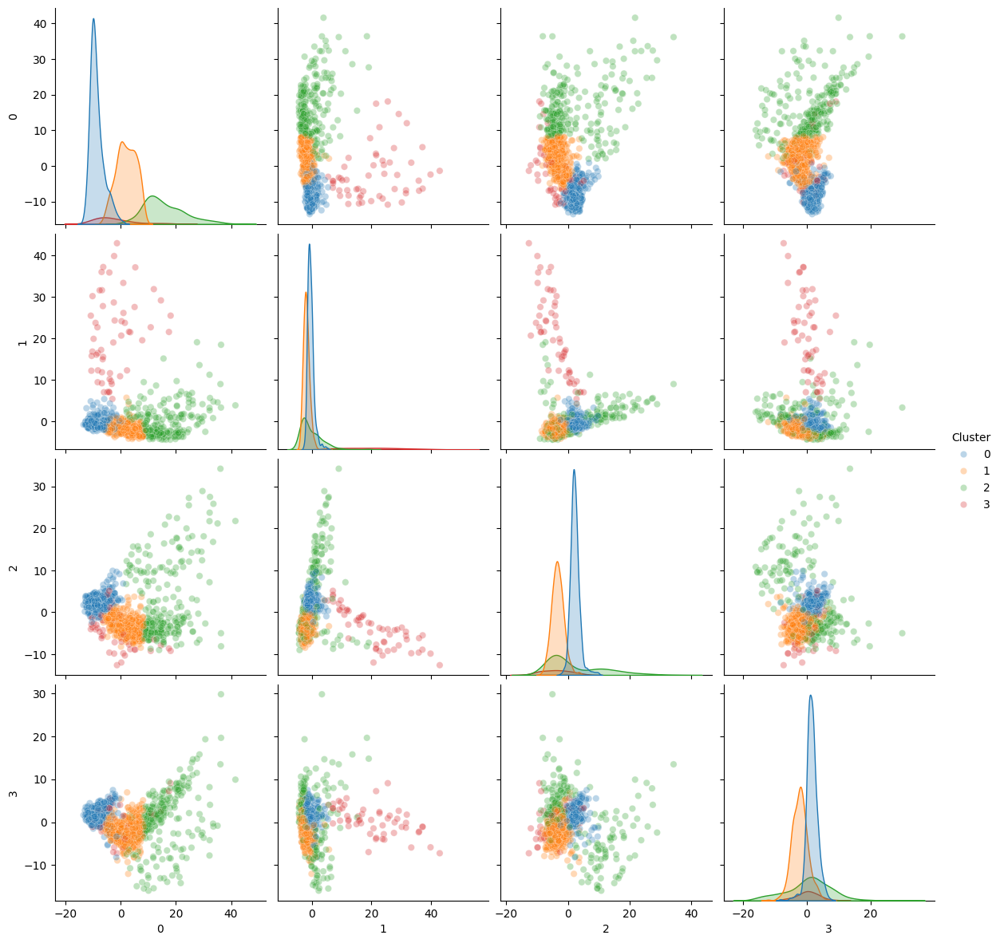

In [ ]:
nmd_plot.plot_embedding_grid(data_all_pca.obsm["X_pca"][:,:4], hue=data_all_pca.obs["leiden_opt"], size=3)

## Fit NMD

In [ ]:
k_opt = 4 # to match pca
beta_opt = 0.7
data_layer = "normalized_counts"

In [10]:
m, n = data_counts.X.shape
X_nmd = ut.convert_to_dense_counts(data_counts, layer=data_layer)
m, n = X_nmd.shape
W0, H0 = cs.nuclear_norm_init(X_nmd, m, n, k_opt)
Theta0 = W0 @ H0

In [11]:
Theta_3b, W_3b, H_3b, loss_3b, iters_3b, times_3b = nmd.nmd_3b(X_nmd, r=k_opt, W0=W0, H0=H0, beta1=beta_opt, tol_over_10iters=1e-4)

Running 3B-NMD, evolution of [iteration number : relative error in %] - time per iteration
[0 : 72.552596] - 0.155113 secs
[1 : 72.139921] - 0.156732 secs
[2 : 71.871174] - 0.151408 secs
[3 : 71.841188] - 0.153610 secs
[4 : 71.803532] - 0.153206 secs
[5 : 71.766322] - 0.153474 secs
[6 : 71.721129] - 0.151633 secs
[7 : 71.690376] - 0.155153 secs
[8 : 71.660046] - 0.151107 secs
[9 : 71.627790] - 0.153576 secs
[10 : 71.605853] - 0.153162 secs
[11 : 71.589958] - 0.153403 secs
[12 : 71.576321] - 0.151679 secs
[13 : 71.565081] - 0.155628 secs
[14 : 71.555909] - 0.151308 secs
[15 : 71.547827] - 0.153765 secs
[16 : 71.540832] - 0.153164 secs
[17 : 71.534185] - 0.153944 secs
[18 : 71.527599] - 0.151512 secs
[19 : 71.521705] - 0.155102 secs
[20 : 71.516507] - 0.151230 secs
[21 : 71.511533] - 0.153709 secs
[22 : 71.506777] - 0.153179 secs
[23 : 71.502081] - 0.153225 secs
[24 : 71.497455] - 0.151630 secs
[25 : 71.492940] - 0.155150 secs
[26 : 71.488468] - 0.151143 secs
[27 : 71.484048] - 0.153629 

In [12]:
importlib.reload(nmd_plot)

<module 'tools.util_plot' from '/dss/dsshome1/07/di35buw/NMD/BacSC/tools/util_plot.py'>

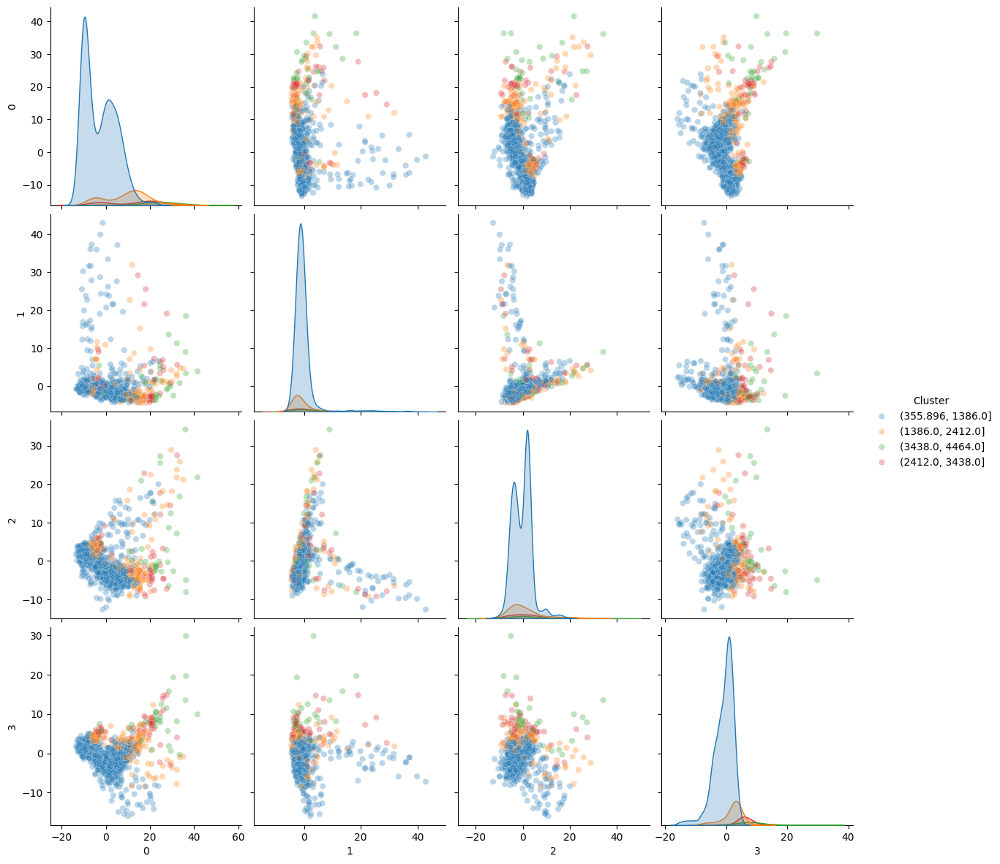

In [13]:
nmd_plot.plot_embedding_grid(data_all_pca.obsm["X_pca"][:,:4], hue=pd.cut(data_counts.obs["total_counts"], bins=4), size=3)

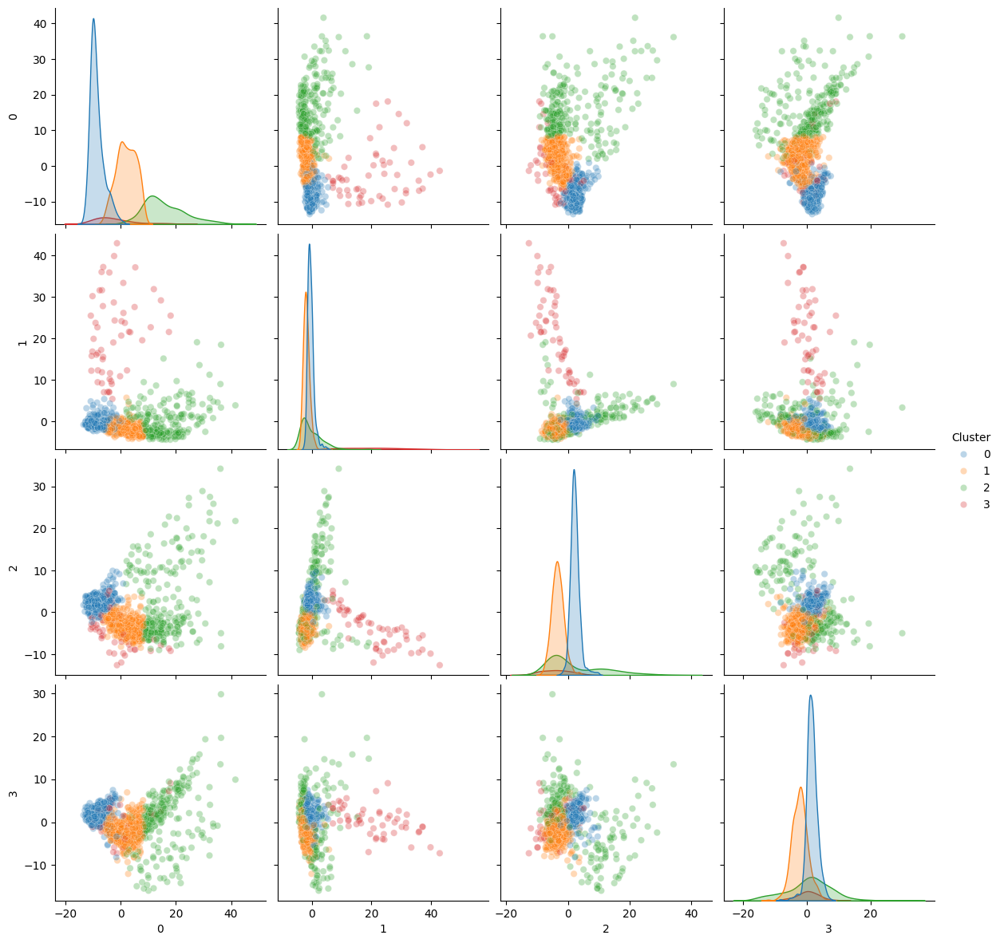

In [14]:
nmd_plot.plot_embedding_grid(data_all_pca.obsm["X_pca"][:,:4], hue=data_all_pca.obs["leiden_opt"], size=3)

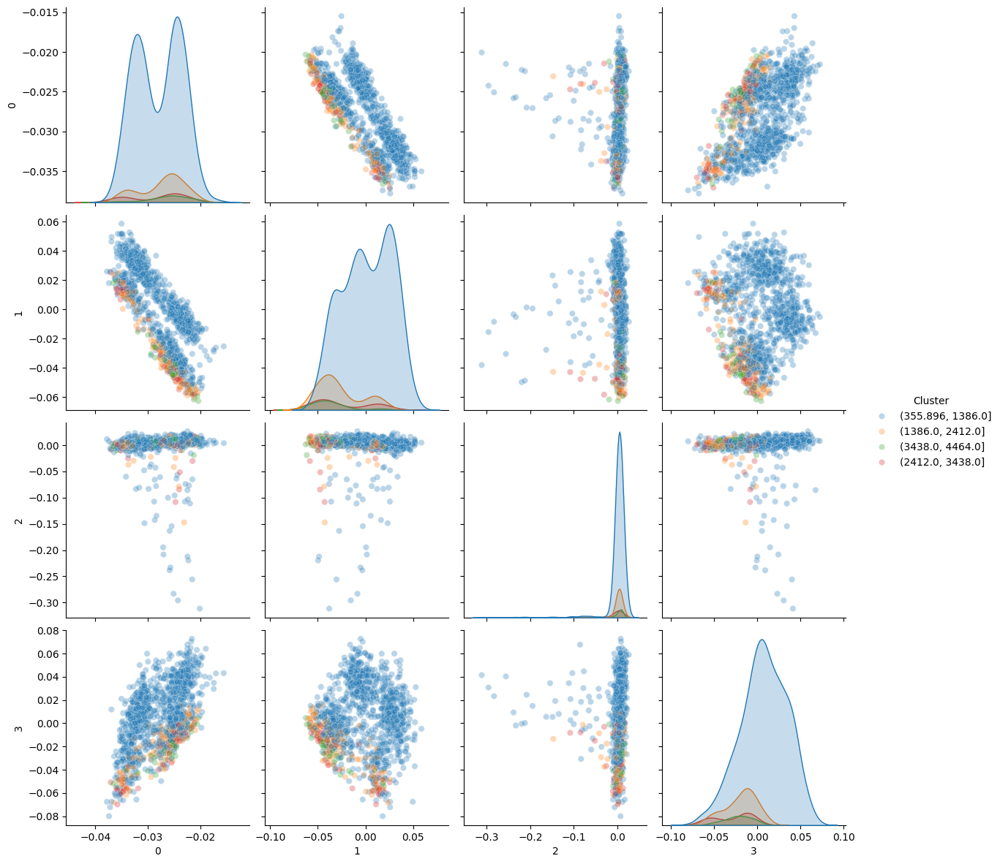

In [15]:
nmd_plot.plot_embedding_grid(W0, hue=pd.cut(data_counts.obs["total_counts"], bins=4), size=3)

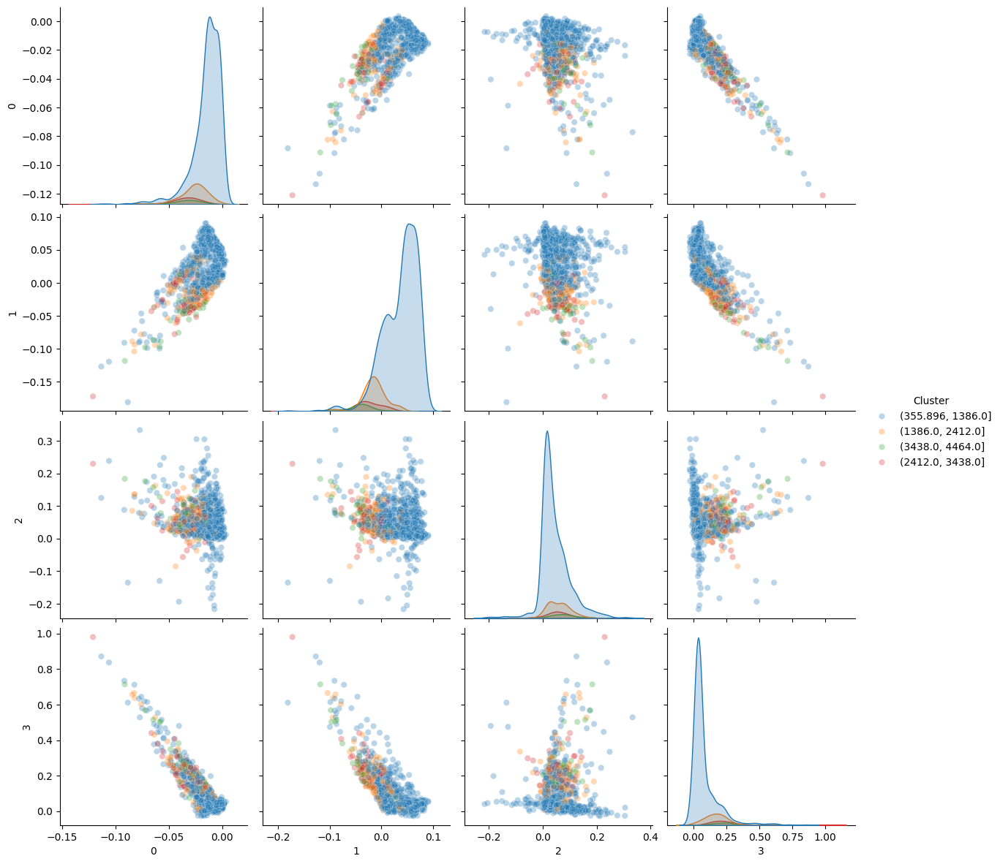

In [16]:
nmd_plot.plot_embedding_grid(W_3b, hue=pd.cut(data_counts.obs["total_counts"], bins=4), size=3)

In [17]:
df_pca = pd.DataFrame(data_all_pca.obsm["X_pca"][:,:4].copy())
df_nmd = pd.DataFrame(W_3b)

In [18]:
df_pca.columns = ["pca_dim1", "pca_dim2", "pca_dim3", "pca_dim4"]
df_nmd.columns = [f"nmd_dim{i + 1}" for i in df_nmd.columns.values]

In [19]:
df_both = pd.concat([df_pca, df_nmd], axis=1)
df_both["total_counts"] = data_counts.obs["total_counts"].tolist()
df_both["total_counts_grouped"] = pd.cut(df_both["total_counts"], bins=4)
df_both["pca_cluster"] = data_all_pca.obs["leiden_opt"].tolist()

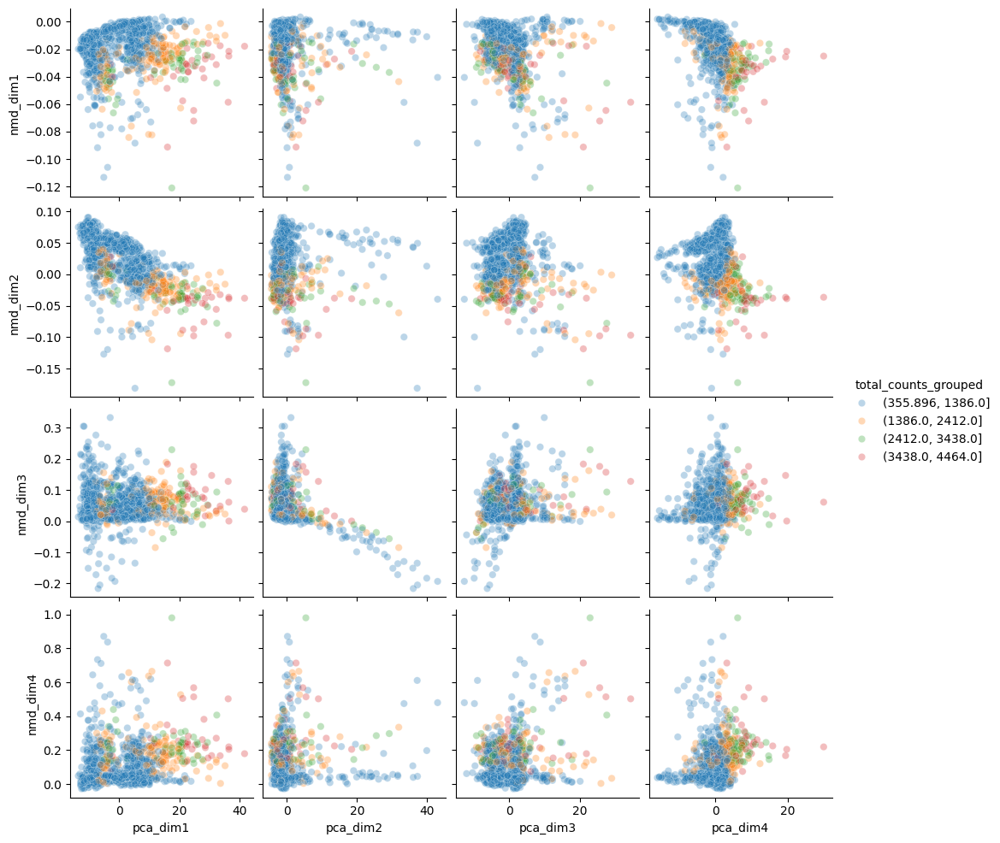

In [20]:
sns.pairplot(df_both, x_vars=df_pca.columns, y_vars=df_nmd.columns.values, hue="total_counts_grouped", plot_kws={"alpha": 0.3})

<Axes: >

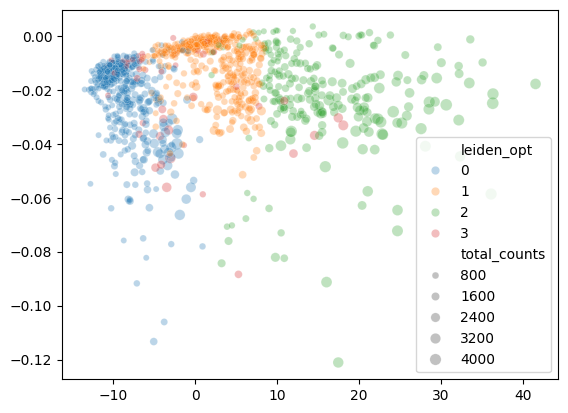

In [21]:
sns.scatterplot(x = data_all_pca.obsm["X_pca"][:,0], y=W_3b[:,0], size=data_counts.obs["total_counts"], alpha=0.3, hue=data_all_pca.obs["leiden_opt"])

<Axes: >

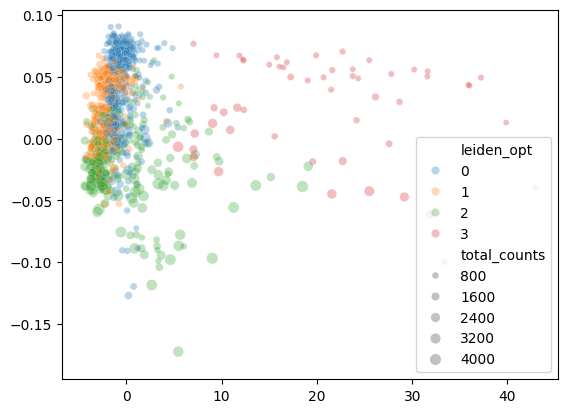

In [22]:
sns.scatterplot(x = data_all_pca.obsm["X_pca"][:,1], y=W_3b[:,1], 
                size=data_counts.obs["total_counts"], 
                alpha=0.3, hue=data_all_pca.obs["leiden_opt"])

<Axes: >

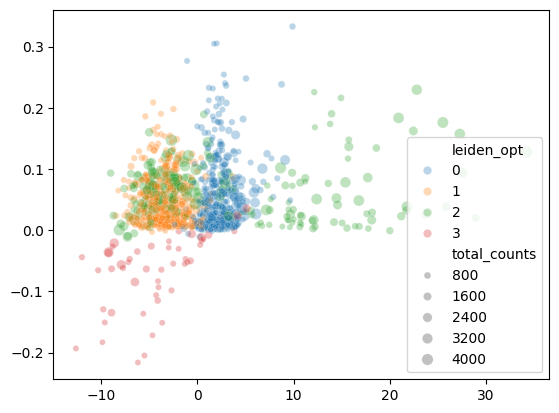

In [23]:
sns.scatterplot(x = data_all_pca.obsm["X_pca"][:,2], y=W_3b[:,2], 
                size=data_counts.obs["total_counts"], 
                alpha=0.3, hue=data_all_pca.obs["leiden_opt"])

<Axes: >

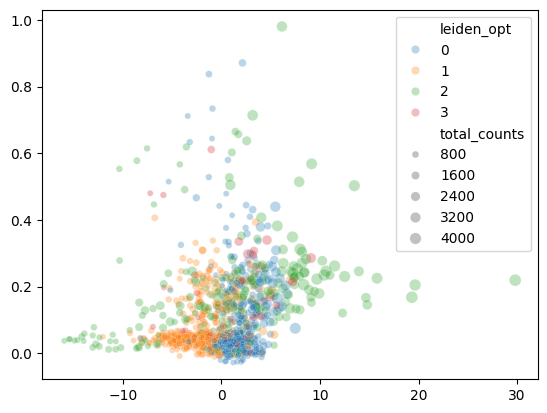

In [24]:
sns.scatterplot(x = data_all_pca.obsm["X_pca"][:,3], y=W_3b[:,3], 
                size=data_counts.obs["total_counts"], 
                alpha=0.3, hue=data_all_pca.obs["leiden_opt"])

In [25]:
data_train, data_test = cs.countsplit_adata(data_counts, data_dist="NB", beta_key="nb_overdisp_cutoff", layer="normalized_counts", min_genes=1, max_counts=1e9, seed=1234)

In [32]:
data_counts.obsm["X_3b"] = W_3b.copy()

In [33]:
importlib.reload(scd)

n_neighborss = [10, 15, 20, 25, 30, 35, 40, 45, 50, 60, 70, 80, 90, 100, 150, 200, 250]
min_dists = [0.05, 0.1, 0.3, 0.5, 0.7]

scdeed_result, rel_scores, null_rel_scores, reliabilities, n_neighbors_opt, min_dist_opt = scd.scdeed_parameter_selection(
    data_counts, n_neighborss, min_dists, n_pcs=k_opt, rng_seed=5678, layer = "normalized_counts",
    embedding_method="UMAP", similarity_percent=0.5, save_path="S2_filtered_scdeed_nmd")

calculating (10, 0.05) - run 1/85
calculating (10, 0.1) - run 2/85
calculating (10, 0.3) - run 3/85
calculating (10, 0.5) - run 4/85
calculating (10, 0.7) - run 5/85
calculating (15, 0.05) - run 6/85
calculating (15, 0.1) - run 7/85
calculating (15, 0.3) - run 8/85
calculating (15, 0.5) - run 9/85
calculating (15, 0.7) - run 10/85
calculating (20, 0.05) - run 11/85
calculating (20, 0.1) - run 12/85
calculating (20, 0.3) - run 13/85
calculating (20, 0.5) - run 14/85
calculating (20, 0.7) - run 15/85
calculating (25, 0.05) - run 16/85
calculating (25, 0.1) - run 17/85
calculating (25, 0.3) - run 18/85
calculating (25, 0.5) - run 19/85
calculating (25, 0.7) - run 20/85
calculating (30, 0.05) - run 21/85
calculating (30, 0.1) - run 22/85
calculating (30, 0.3) - run 23/85
calculating (30, 0.5) - run 24/85
calculating (30, 0.7) - run 25/85
calculating (35, 0.05) - run 26/85
calculating (35, 0.1) - run 27/85
calculating (35, 0.3) - run 28/85
calculating (35, 0.5) - run 29/85
calculating (35, 

Optimal number of neighbors: 30
Optimal min_dist: 0.5


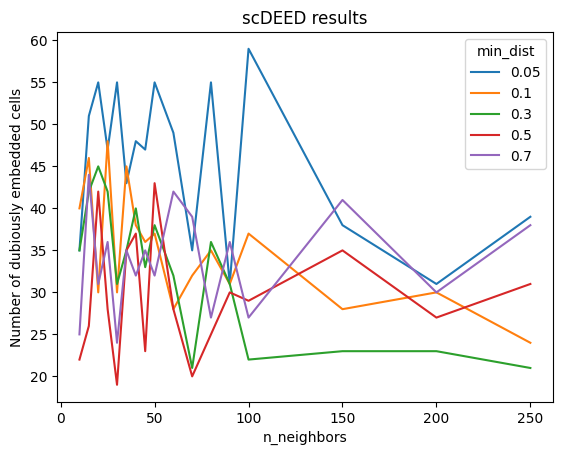

In [34]:
print(f"Optimal number of neighbors: {n_neighbors_opt}")
print(f"Optimal min_dist: {min_dist_opt}")

sns.lineplot(data=scdeed_result, x="n_neighbors", y="num_dubious", hue="min_dist", palette="tab10")
plt.title("scDEED results")
plt.ylabel("Number of dubiously embedded cells")
plt.show()

In [35]:
sc.pp.neighbors(data_counts, n_neighbors=n_neighbors_opt, n_pcs=k_opt, use_rep="X_3b")
sc.tl.umap(data_counts, neighbors_key="neighbors", min_dist=min_dist_opt, spread=1)

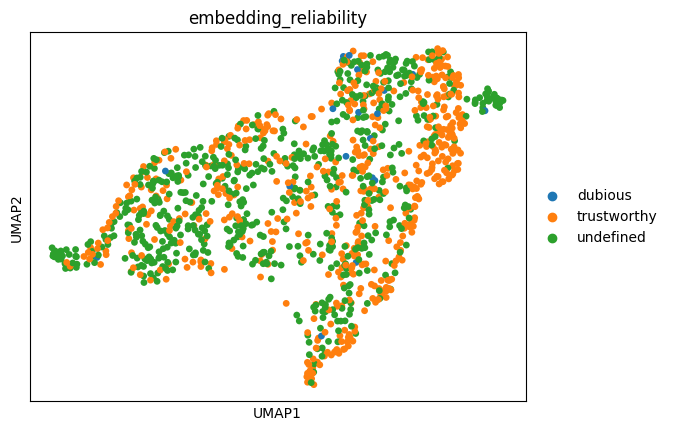

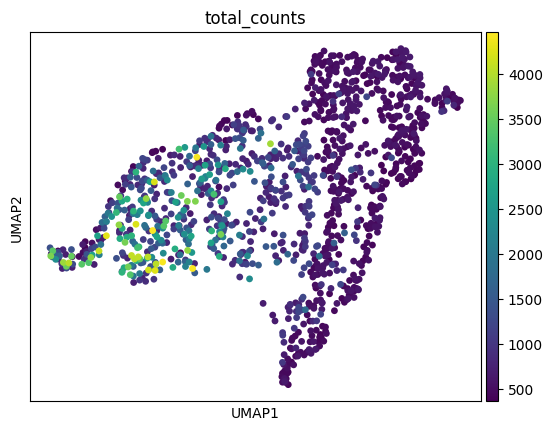

In [36]:
sc.pl.umap(data_counts, color="embedding_reliability", alpha=1)
plt.show()

sc.pl.umap(data_counts, color="total_counts", alpha=1, cmap="viridis")
plt.show()

In [38]:
# Normalizes X, such that: each barcode has total count equal to median of total counts before normalization
sc.pp.normalize_total(data_train, target_sum=None, layer=None)

# Only normalization
data_train.layers["normalized_counts"] = data_train.X.copy()

# Variance Stabilization Transformation
data_train.X = sps.csr_matrix(np.log(data_train.X.toarray() + np.array(data_train.var["nb_overdisp_cutoff"] / 4)))
data_train.layers["vst_counts"] = data_train.X.copy()
data_train.layers["vst_counts_shifted"] = data_train.layers["vst_counts"].copy().todense() + data_train.layers["vst_counts"].min() * -1.

# test data
sc.pp.normalize_total(data_test, target_sum=None, layer=None)
data_test.layers["normalized_counts"] = data_test.X.copy()
data_test.X = sps.csr_matrix(np.log(data_test.X.toarray() + np.array(data_test.var["nb_overdisp_cutoff"] / 4)))
data_test.layers["vst_counts"] = data_test.X.copy()
data_test.layers["vst_counts_shifted"] = data_test.layers["vst_counts"].copy().todense() + data_test.layers["vst_counts"].min() * -1.

In [39]:
X_train = ut.convert_to_dense_counts(data_train, layer=data_layer)
m, n = X_train.shape
W0_train, H0_train = cs.nuclear_norm_init(X_train, m, n, k_opt)

In [40]:
X_test = ut.convert_to_dense_counts(data_test, layer=data_layer)
m, n = X_test.shape
W0_test, H0_test = cs.nuclear_norm_init(X_test, m, n, k_opt)

In [41]:
_, W_train, H_train,  _, _, _ = nmd.nmd_3b(X_train, r=k_opt, W0=W0_train, H0=H0_train, beta1=.8)

Running 3B-NMD, evolution of [iteration number : relative error in %] - time per iteration
[0 : 81.313431] - 0.129681 secs
[1 : 81.132062] - 0.127970 secs
[2 : 81.109323] - 0.126426 secs
[3 : 81.017545] - 0.128507 secs
[4 : 80.915400] - 0.127030 secs
[5 : 80.872630] - 0.127580 secs
[6 : 80.752524] - 0.127773 secs
[7 : 80.657203] - 0.128969 secs
[8 : 80.590050] - 0.126353 secs
[9 : 80.562174] - 0.129446 secs
[10 : 80.534442] - 0.127034 secs
[11 : 80.521256] - 0.129035 secs
[12 : 80.496037] - 0.126905 secs
[13 : 80.464603] - 0.128909 secs
[14 : 80.424236] - 0.126350 secs
[15 : 80.384275] - 0.128849 secs
[16 : 80.349712] - 0.126977 secs
[17 : 80.318607] - 0.128424 secs
[18 : 80.291694] - 0.126943 secs
[19 : 80.265988] - 0.128960 secs
[20 : 80.246046] - 0.126367 secs
[21 : 80.224093] - 0.128876 secs
[22 : 80.202513] - 0.127142 secs
[23 : 80.180178] - 0.128167 secs
[24 : 80.158785] - 0.126882 secs
[25 : 80.137920] - 0.129028 secs
[26 : 80.116257] - 0.126072 secs
[27 : 80.094284] - 0.129341 

[243 : 77.782667] - 0.129263 secs
[244 : 77.778942] - 0.127173 secs
[245 : 77.775256] - 0.128369 secs
[246 : 77.771608] - 0.127006 secs
[247 : 77.767995] - 0.128958 secs
[248 : 77.764415] - 0.126593 secs
[249 : 77.760871] - 0.128963 secs
[250 : 77.757360] - 0.127209 secs
[251 : 77.753883] - 0.128499 secs
[252 : 77.750433] - 0.126930 secs
[253 : 77.747014] - 0.129120 secs
[254 : 77.743629] - 0.126408 secs
[255 : 77.740277] - 0.128779 secs
[256 : 77.736958] - 0.127135 secs
[257 : 77.733671] - 0.128322 secs
[258 : 77.730413] - 0.126994 secs
[259 : 77.727181] - 0.129018 secs
[260 : 77.723980] - 0.126530 secs
[261 : 77.720809] - 0.129036 secs
[262 : 77.717664] - 0.127157 secs
[263 : 77.714548] - 0.128244 secs
[264 : 77.711459] - 0.127057 secs
[265 : 77.708396] - 0.129012 secs
[266 : 77.705356] - 0.127014 secs
[267 : 77.702302] - 0.128942 secs
[268 : 77.699269] - 0.127164 secs
[269 : 77.696261] - 0.128511 secs
[270 : 77.693279] - 0.126882 secs
[271 : 77.690321] - 0.129033 secs
[272 : 77.6873

[485 : 77.278591] - 0.128703 secs
[486 : 77.277395] - 0.126707 secs
[487 : 77.276207] - 0.128952 secs
[488 : 77.275031] - 0.126103 secs
[489 : 77.273867] - 0.128987 secs
[490 : 77.272712] - 0.127144 secs
[491 : 77.271565] - 0.128185 secs
[492 : 77.270429] - 0.126913 secs
[493 : 77.269301] - 0.128955 secs
[494 : 77.268181] - 0.126286 secs
[495 : 77.267069] - 0.129393 secs
[496 : 77.265967] - 0.127138 secs
[497 : 77.264873] - 0.128227 secs
[498 : 77.263787] - 0.127092 secs
[499 : 77.262709] - 0.128789 secs
[500 : 77.261638] - 0.126568 secs
[501 : 77.260571] - 0.129261 secs
[502 : 77.259511] - 0.127054 secs
[503 : 77.258451] - 0.128581 secs
[504 : 77.257397] - 0.126862 secs
[505 : 77.256349] - 0.128948 secs
[506 : 77.255308] - 0.126402 secs
[507 : 77.254272] - 0.128788 secs
[508 : 77.253243] - 0.126987 secs
[509 : 77.252221] - 0.128280 secs
[510 : 77.251204] - 0.126839 secs
[511 : 77.250192] - 0.129071 secs
[512 : 77.249185] - 0.126495 secs
[513 : 77.248182] - 0.128969 secs
[514 : 77.2471

[727 : 77.100636] - 0.129090 secs
[728 : 77.100175] - 0.126410 secs
[729 : 77.099715] - 0.129416 secs
[730 : 77.099255] - 0.127079 secs
[731 : 77.098797] - 0.128368 secs
[732 : 77.098339] - 0.127241 secs
[733 : 77.097882] - 0.128822 secs
[734 : 77.097426] - 0.126441 secs
[735 : 77.096971] - 0.129422 secs
[736 : 77.096517] - 0.127195 secs
[737 : 77.096063] - 0.128343 secs
[738 : 77.095610] - 0.126936 secs
[739 : 77.095158] - 0.129144 secs
[740 : 77.094707] - 0.126601 secs
[741 : 77.094256] - 0.128845 secs
[742 : 77.093806] - 0.127066 secs
[743 : 77.093358] - 0.128305 secs
[744 : 77.092910] - 0.126912 secs
[745 : 77.092462] - 0.129028 secs
[746 : 77.092016] - 0.126208 secs
[747 : 77.091570] - 0.128815 secs
[748 : 77.091125] - 0.127142 secs
[749 : 77.090681] - 0.128352 secs
[750 : 77.090237] - 0.126863 secs
[751 : 77.089794] - 0.128918 secs
[752 : 77.089352] - 0.126527 secs
[753 : 77.088911] - 0.129422 secs
[754 : 77.088471] - 0.127154 secs
[755 : 77.088032] - 0.128383 secs
[756 : 77.0875

[969 : 77.004174] - 0.129060 secs
[970 : 77.003884] - 0.127196 secs
[971 : 77.003594] - 0.128596 secs
[972 : 77.003304] - 0.126916 secs
[973 : 77.003015] - 0.128986 secs
[974 : 77.002726] - 0.126532 secs
[975 : 77.002438] - 0.128541 secs
[976 : 77.002150] - 0.127110 secs
[977 : 77.001863] - 0.128318 secs
[978 : 77.001576] - 0.127035 secs
[979 : 77.001290] - 0.128982 secs
[980 : 77.001005] - 0.126669 secs
[981 : 77.000720] - 0.128854 secs
[982 : 77.000436] - 0.127217 secs
[983 : 77.000152] - 0.128473 secs
[984 : 76.999869] - 0.127041 secs
[985 : 76.999586] - 0.129129 secs
[986 : 76.999304] - 0.126555 secs
[987 : 76.999022] - 0.129412 secs
[988 : 76.998740] - 0.127115 secs
[989 : 76.998458] - 0.128405 secs
[990 : 76.998177] - 0.127119 secs
[991 : 76.997897] - 0.129195 secs
[992 : 76.997618] - 0.126999 secs
[993 : 76.997339] - 0.128858 secs
[994 : 76.997061] - 0.127187 secs
[995 : 76.996783] - 0.128444 secs
[996 : 76.996506] - 0.127007 secs
[997 : 76.996229] - 0.130091 secs
[998 : 76.9959

In [42]:
_, W_test, H_test,  _, _, _ = nmd.nmd_3b(X_test, r=k_opt, W0=W0_test, H0=H0_test, beta1=.8)

Running 3B-NMD, evolution of [iteration number : relative error in %] - time per iteration
[0 : 79.541633] - 0.132151 secs
[1 : 79.372719] - 0.127085 secs
[2 : 79.340897] - 0.128269 secs
[3 : 79.336632] - 0.128820 secs
[4 : 79.275388] - 0.129031 secs
[5 : 79.143968] - 0.128365 secs
[6 : 79.055946] - 0.128862 secs
[7 : 78.979069] - 0.129105 secs
[8 : 78.913788] - 0.128322 secs
[9 : 78.853929] - 0.129323 secs
[10 : 78.822773] - 0.129072 secs
[11 : 78.776087] - 0.128356 secs
[12 : 78.735720] - 0.128757 secs
[13 : 78.692881] - 0.128994 secs
[14 : 78.650651] - 0.128821 secs
[15 : 78.600038] - 0.128703 secs
[16 : 78.558068] - 0.129038 secs
[17 : 78.510953] - 0.128411 secs
[18 : 78.474160] - 0.128811 secs
[19 : 78.436174] - 0.128942 secs
[20 : 78.411550] - 0.128370 secs
[21 : 78.377994] - 0.128696 secs
[22 : 78.348032] - 0.129370 secs
[23 : 78.317253] - 0.128113 secs
[24 : 78.297982] - 0.128924 secs
[25 : 78.270708] - 0.128968 secs
[26 : 78.247922] - 0.128460 secs
[27 : 78.221144] - 0.128982 

[242 : 76.242809] - 0.127674 secs
[243 : 76.229456] - 0.128971 secs
[244 : 76.230037] - 0.128975 secs
[245 : 76.221340] - 0.128420 secs
[246 : 76.232298] - 0.128799 secs
[247 : 76.216203] - 0.129580 secs
[248 : 76.216681] - 0.128494 secs
[249 : 76.208821] - 0.128874 secs
[250 : 76.211451] - 0.129077 secs
[251 : 76.202953] - 0.128391 secs
[252 : 76.199573] - 0.129177 secs
[253 : 76.194205] - 0.128851 secs
[254 : 76.202643] - 0.129205 secs
[255 : 76.188132] - 0.134226 secs
[256 : 76.190116] - 0.129207 secs
[257 : 76.181878] - 0.128225 secs
[258 : 76.191594] - 0.128907 secs
[259 : 76.177856] - 0.129071 secs
[260 : 76.176771] - 0.128488 secs
[261 : 76.169663] - 0.129187 secs
[262 : 76.177820] - 0.129059 secs
[263 : 76.165072] - 0.128567 secs
[264 : 76.163950] - 0.128783 secs
[265 : 76.157436] - 0.129631 secs
[266 : 76.164888] - 0.127816 secs
[267 : 76.152902] - 0.129111 secs
[268 : 76.152294] - 0.129051 secs
[269 : 76.145324] - 0.128430 secs
[270 : 76.154588] - 0.129530 secs
[271 : 76.1413

[483 : 75.757864] - 0.128857 secs
[484 : 75.756783] - 0.128974 secs
[485 : 75.755707] - 0.128385 secs
[486 : 75.754636] - 0.128920 secs
[487 : 75.753569] - 0.128990 secs
[488 : 75.752505] - 0.128400 secs
[489 : 75.751445] - 0.128836 secs
[490 : 75.750391] - 0.128893 secs
[491 : 75.749343] - 0.128360 secs
[492 : 75.748298] - 0.128811 secs
[493 : 75.747256] - 0.129014 secs
[494 : 75.746219] - 0.128287 secs
[495 : 75.745186] - 0.129000 secs
[496 : 75.744158] - 0.129070 secs
[497 : 75.743134] - 0.129185 secs
[498 : 75.742116] - 0.128763 secs
[499 : 75.741102] - 0.128965 secs
[500 : 75.740092] - 0.128259 secs
[501 : 75.739086] - 0.128898 secs
[502 : 75.738082] - 0.129657 secs
[503 : 75.737082] - 0.127429 secs
[504 : 75.736086] - 0.129160 secs
[505 : 75.735094] - 0.128801 secs
[506 : 75.734105] - 0.128506 secs
[507 : 75.733121] - 0.129081 secs
[508 : 75.732140] - 0.128730 secs
[509 : 75.731163] - 0.128360 secs
[510 : 75.730190] - 0.128907 secs
[511 : 75.729221] - 0.129026 secs
[512 : 75.7282

[724 : 75.574819] - 0.129045 secs
[725 : 75.574328] - 0.128485 secs
[726 : 75.573839] - 0.128864 secs
[727 : 75.573349] - 0.128703 secs
[728 : 75.572858] - 0.128303 secs
[729 : 75.572367] - 0.129369 secs
[730 : 75.571876] - 0.129193 secs
[731 : 75.571389] - 0.128588 secs
[732 : 75.570904] - 0.128953 secs
[733 : 75.570421] - 0.129185 secs
[734 : 75.569940] - 0.129017 secs
[735 : 75.569460] - 0.129031 secs
[736 : 75.568981] - 0.128882 secs
[737 : 75.568504] - 0.128416 secs
[738 : 75.568029] - 0.128813 secs
[739 : 75.567555] - 0.129186 secs
[740 : 75.567083] - 0.128479 secs
[741 : 75.566611] - 0.129069 secs
[742 : 75.566141] - 0.128973 secs
[743 : 75.565672] - 0.128434 secs
[744 : 75.565205] - 0.129130 secs
[745 : 75.564739] - 0.128927 secs
[746 : 75.564275] - 0.128069 secs
[747 : 75.563812] - 0.129073 secs
[748 : 75.563351] - 0.129114 secs
[749 : 75.562891] - 0.128016 secs
[750 : 75.562432] - 0.128892 secs
[751 : 75.561975] - 0.128990 secs
[752 : 75.561520] - 0.129040 secs
[753 : 75.5610

[965 : 75.480545] - 0.128547 secs
[966 : 75.480203] - 0.129855 secs
[967 : 75.479861] - 0.128045 secs
[968 : 75.479517] - 0.128622 secs
[969 : 75.479171] - 0.128922 secs
[970 : 75.478825] - 0.129078 secs
[971 : 75.478480] - 0.128496 secs
[972 : 75.478135] - 0.128848 secs
[973 : 75.477790] - 0.129424 secs
[974 : 75.477445] - 0.128392 secs
[975 : 75.477100] - 0.128864 secs
[976 : 75.476756] - 0.129348 secs
[977 : 75.476412] - 0.128308 secs
[978 : 75.476069] - 0.128986 secs
[979 : 75.475727] - 0.129137 secs
[980 : 75.475385] - 0.128428 secs
[981 : 75.475043] - 0.129525 secs
[982 : 75.474701] - 0.128978 secs
[983 : 75.474359] - 0.128657 secs
[984 : 75.474018] - 0.128928 secs
[985 : 75.473677] - 0.129124 secs
[986 : 75.473335] - 0.128483 secs
[987 : 75.472994] - 0.128933 secs
[988 : 75.472654] - 0.129064 secs
[989 : 75.472314] - 0.128942 secs
[990 : 75.471975] - 0.128991 secs
[991 : 75.471636] - 0.129238 secs
[992 : 75.471298] - 0.128538 secs
[993 : 75.470960] - 0.128930 secs
[994 : 75.4706

In [43]:
data_train.obsm["X_3b"] = W_train
data_test.obsm["X_3b"] = W_test

In [44]:
sc.pp.neighbors(data_train, n_neighbors=n_neighbors_opt, n_pcs=k_opt, use_rep="X_3b")
sc.tl.umap(data_train, neighbors_key="neighbors", min_dist=min_dist_opt, spread=1)

sc.pp.neighbors(data_test, n_neighbors=n_neighbors_opt, n_pcs=k_opt, use_rep="X_3b")
sc.tl.umap(data_test, neighbors_key="neighbors", min_dist=min_dist_opt, spread=1)


theta_opt, mirror_opt, umap_2_opt, ssd = ut.find_opt_umap_rotation(data_train.obsm["X_umap"].copy(), data_test.obsm["X_umap"].copy())
data_test.obsm["X_umap_rot"] = umap_2_opt

NMD viel sensitiver auf countsplitting als PCA:

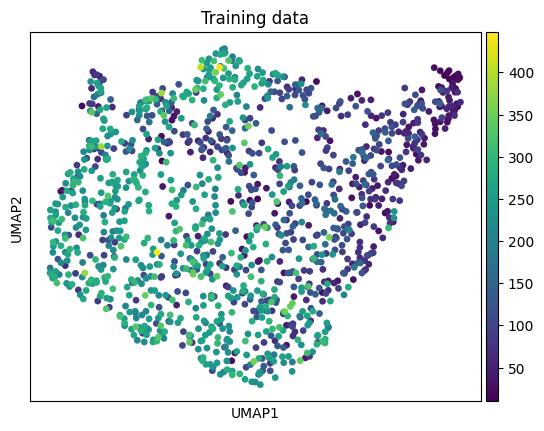

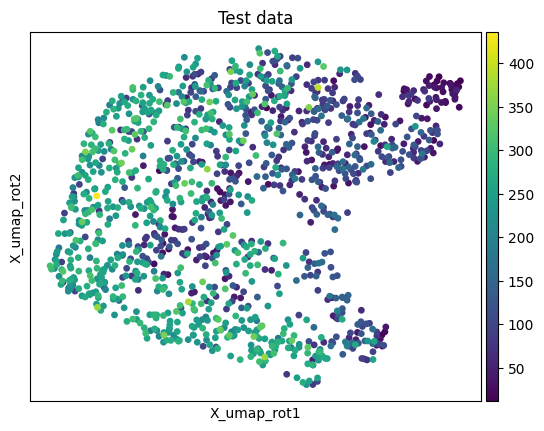

In [45]:
sc.pl.umap(data_train, color="total_counts", cmap="viridis", title="Training data")
plt.show()

sc.pl.embedding(data_test, basis="X_umap_rot", color="total_counts", cmap="viridis", title="Test data")
plt.show()

In [ ]:
# !pip install leidenalg

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com

[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python -m pip install --upgrade pip


In [58]:
importlib.reload(co)
res_min = 0.01
res_max = 0.5
res_step = 0.02
resolutions = np.round(np.arange(res_min, res_max, res_step), 2)

co.cluster_train_test(data_train, data_test, resolutions, alg="leiden")

In [59]:
sc.pl.embedding(data_test, basis="X_umap_rot", color=[f"leiden_res{resolution}" for resolution in resolutions])
plt.show()

In [60]:
importlib.reload(co)
mod_df, mod_df_wide, res_opt = co.find_optimal_clustering_resolution(data_train, data_test, resolutions)

print(f"Optimal resolution {res_opt}")

resolution: 0.01 - clusters: 1 - Train: 0.49 - Test: 0.49 - Random: 0.49
resolution: 0.03 - clusters: 1 - Train: 0.47 - Test: 0.47 - Random: 0.47
resolution: 0.05 - clusters: 2 - Train: 0.454 - Test: 0.349 - Random: 0.306
resolution: 0.07 - clusters: 2 - Train: 0.444 - Test: 0.302 - Random: 0.245
resolution: 0.09 - clusters: 3 - Train: 0.436 - Test: 0.244 - Random: 0.177
resolution: 0.11 - clusters: 3 - Train: 0.43 - Test: 0.22 - Random: 0.146
resolution: 0.13 - clusters: 3 - Train: 0.423 - Test: 0.212 - Random: 0.14
resolution: 0.15 - clusters: 4 - Train: 0.422 - Test: 0.158 - Random: 0.09
resolution: 0.17 - clusters: 4 - Train: 0.411 - Test: 0.149 - Random: 0.081
resolution: 0.19 - clusters: 4 - Train: 0.406 - Test: 0.144 - Random: 0.078
resolution: 0.21 - clusters: 4 - Train: 0.401 - Test: 0.141 - Random: 0.078
resolution: 0.23 - clusters: 5 - Train: 0.403 - Test: 0.115 - Random: 0.054
resolution: 0.25 - clusters: 5 - Train: 0.399 - Test: 0.111 - Random: 0.05
resolution: 0.27 - clus

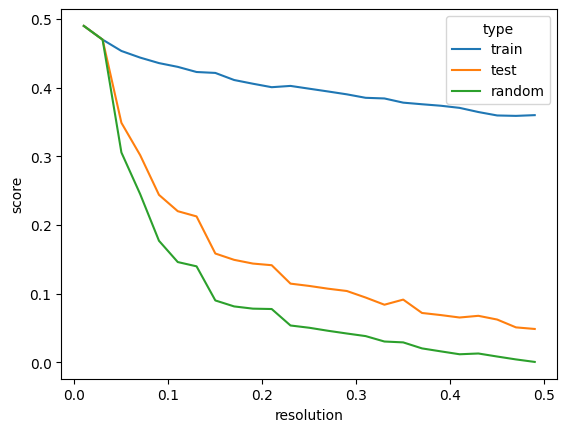

In [61]:
sns.lineplot(data=mod_df, x="resolution", y="score", hue="type")
plt.show()

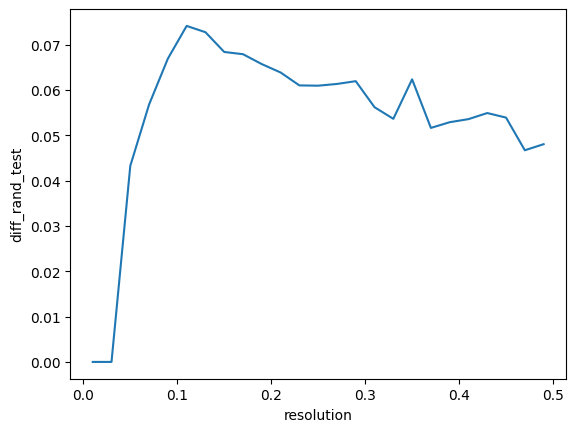

In [62]:
sns.lineplot(data=mod_df_wide, x="resolution", y="diff_rand_test")
plt.show()

In [63]:
sc.tl.leiden(data_counts, resolution=res_opt, key_added="leiden_opt")

In [64]:
data_counts

AnnData object with n_obs × n_vars = 1255 × 5540
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'outlier', 'n_genes', 'total_counts_norm', 'total_counts_scale', 'embedding_reliability', 'reliability_score', 'null_reliability_score', 'leiden_opt'
    var: 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'var_counts', 'nb_mean', 'nb_overdisp', 'nb_overdisp_cutoff', 'nb_overdisp_cutoff_bfgs', 'nb_overdisp_bfgs'
    uns: 'pca', 'neighbors', 'umap', 'embedding_reliability_colors', 'leiden', 'leiden_opt_colors'
    obsm: 'X_pca', 'X_3b', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'normalized_counts', 'vst_counts'
    obsp: 'distances', 'connectivities'

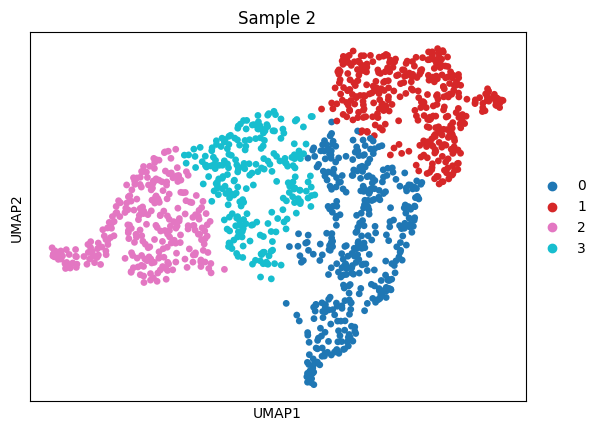

In [65]:
sc.pl.umap(data_counts, color="leiden_opt", palette="tab10", title="Sample 2")
plt.show()

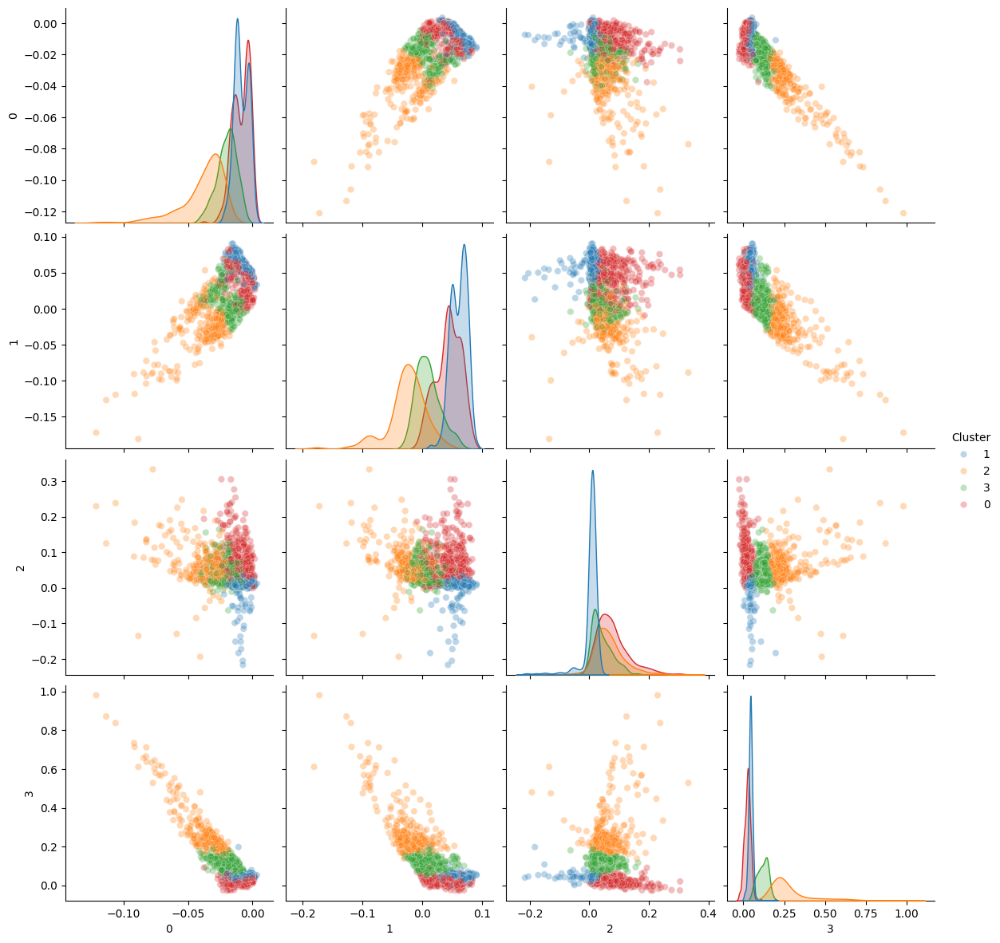

In [66]:
nmd_plot.plot_embedding_grid(data_counts.obsm["X_3b"], hue=data_counts.obs["leiden_opt"], size=3)


In [67]:
pd.crosstab(data_all_pca.obs["leiden_opt"], data_counts.obs["leiden_opt"], rownames=['PCA'], colnames=['NMD'])

NMD,0,1,2,3
PCA,,,,
0,157,195,81,83
1,175,127,63,82
2,45,8,116,69
3,0,33,15,6


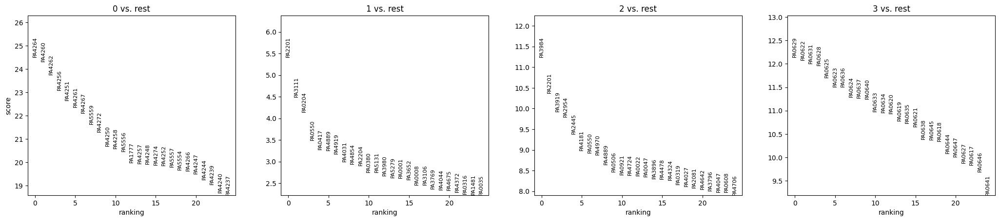

In [70]:
sc.tl.rank_genes_groups(data_all_pca, 'leiden_opt', method='wilcoxon')
sc.pl.rank_genes_groups(data_all_pca, n_genes=25, sharey=False)

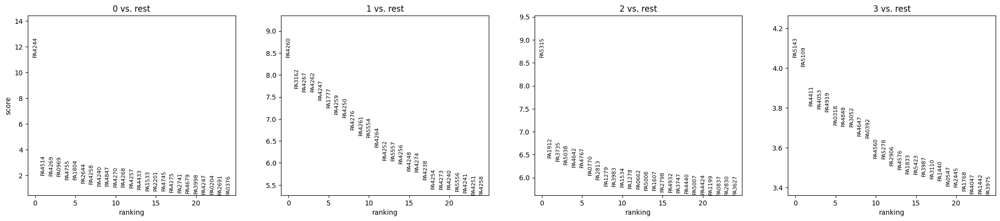

In [69]:
sc.tl.rank_genes_groups(data_counts, 'leiden_opt', method='wilcoxon')
sc.pl.rank_genes_groups(data_counts, n_genes=25, sharey=False)

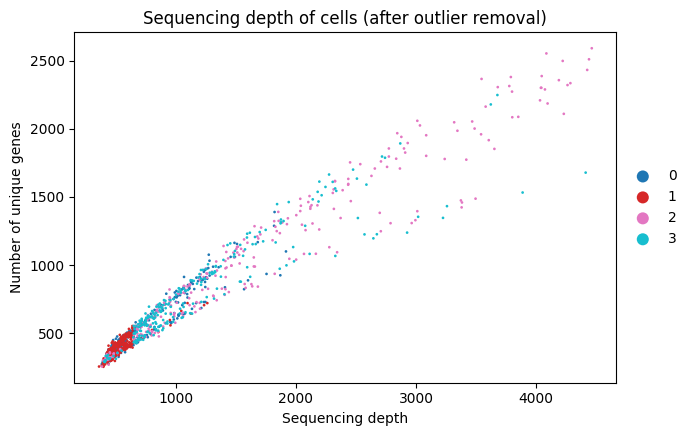

In [71]:
sc.pl.scatter(data_counts, x='total_counts', y='n_genes_by_counts', show=False, size=15, color="leiden_opt")
plt.title("Sequencing depth of cells (after outlier removal)")
plt.xlabel("Sequencing depth")
plt.ylabel("Number of unique genes")
plt.show()

In [78]:
top_genes_3 = [x[2] for x in data_counts.uns["rank_genes_groups"]["names"]]
print(top_genes_3[:25])

['PA5315', 'PA1912', 'PA3735', 'PA5038', 'PA4642', 'PA4767', 'PA0770', 'PA2813', 'PA1279', 'PA3983', 'PA1534', 'PA1278', 'PA0662', 'PA5008', 'PA1607', 'PA2798', 'PA4932', 'PA3747', 'PA4440', 'PA5007', 'PA4424', 'PA1199', 'PA0837', 'PA2830', 'PA3627']


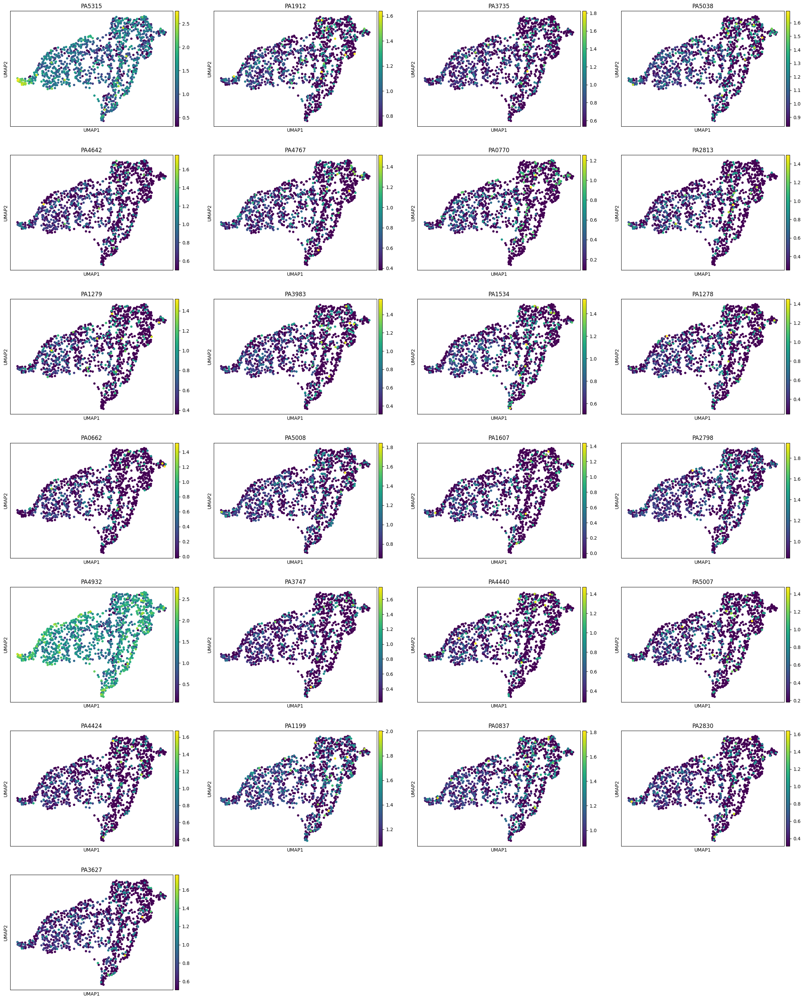

In [79]:
sc.pl.umap(data_counts, color=top_genes_3[:25], palette="tab20", cmap="viridis")

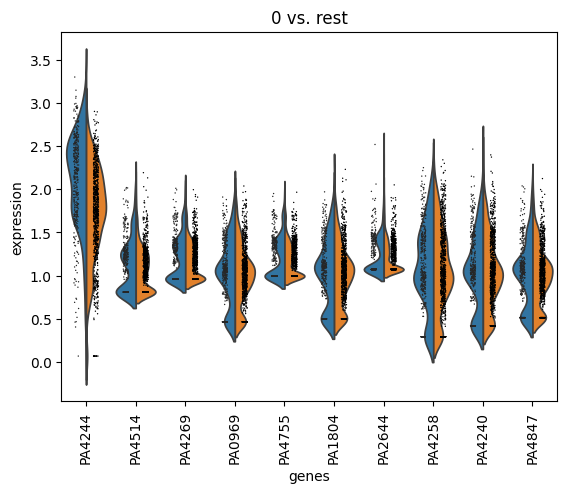

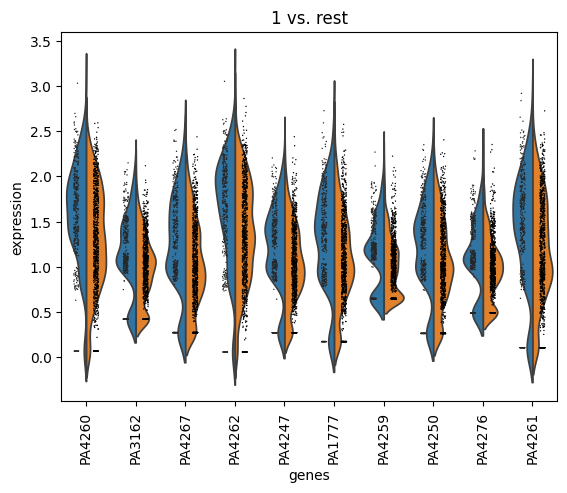

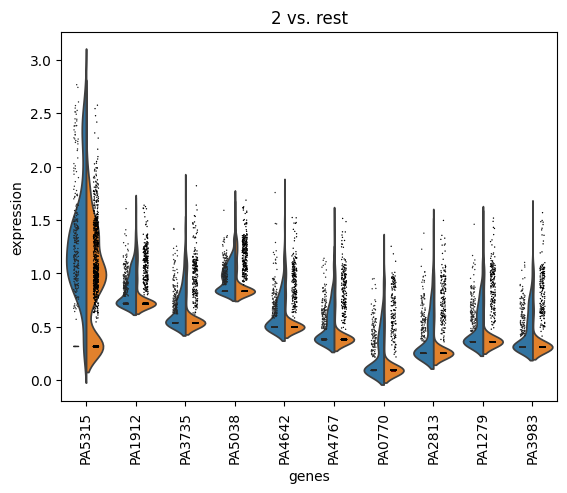

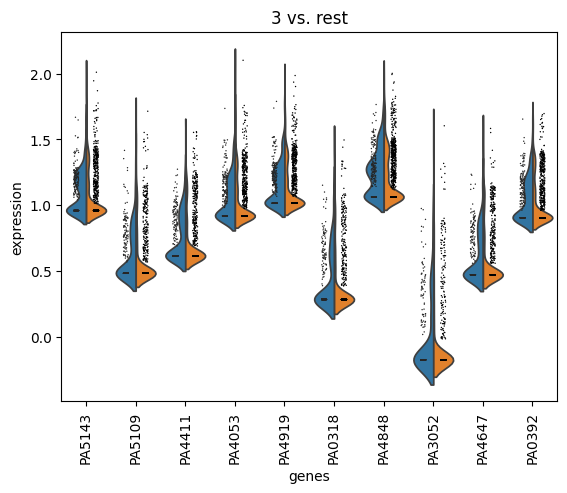

In [80]:
nclust = len(np.unique(data_counts.obs["leiden_opt"]))

for i in range(nclust):
    sc.pl.rank_genes_groups_violin(data_counts, groups=str(i), n_genes=10)